<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Проект: Анализ резюме из HeadHunter
   

In [91]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots

# Исследование структуры данных

1. Прочитайте данные с помощью библиотеки Pandas. Совет: перед чтением обратите внимание на разделитель внутри файла. 

In [92]:
# Считывавем данные, указав в качестве разделителя ";" (параметр sep)
hh_data = pd.read_csv('dst-3.0_16_1_hh_database.csv', sep=';')

#  Согласно контрольному вопросу, проверим размерность таблицы
print(hh_data.shape)

(44744, 12)


2. Выведите несколько первых (последних) строк таблицы, чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [93]:
# Для того, чтобы больше не считывать файл, копируем DataFrame в новую переменную
hh_df = hh_data.copy()

# Выводим первые 5 элементов таблицы
hh_df.head()

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано
2,"Женщина , 36 лет , родилась 12 августа 1982",20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,Среднее специальное образование 2002 Профессио...,16.04.2019 08:35,Не указано
3,"Мужчина , 38 лет , родился 25 июня 1980",100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"Саратов , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",Опыт работы 18 лет 9 месяцев Август 2017 — Ап...,OpenSoft,Инженер-программист,Высшее образование 2002 Саратовский государст...,08.04.2019 14:23,Не указано
4,"Женщина , 26 лет , родилась 3 марта 1993",140000 руб.,Региональный менеджер по продажам,"Москва , не готова к переезду , готова к коман...",полная занятость,полный день,Опыт работы 5 лет 7 месяцев Региональный мене...,Мармелад,Менеджер по продажам,Высшее образование 2015 Кгу Психологии и педаг...,22.04.2019 10:32,Не указано


3. Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице.

4. Обратите внимание на информацию о числе непустых значений.

In [94]:
# Выводим основную информацию, обращаем внимание на тип данных и о числе непустых значений
hh_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

5. Выведите основную статистическую информацию о столбцах.


In [95]:
# Выводим основую статистическую информацию, обращаем внимание на количество уникальных значений "Опыт работы" и на распространенную искомую должность
hh_df.describe()

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
count,44744,44744,44744,44744,44744,44744,44576,44743,44742,44744,44744,44744
unique,16003,690,14929,10063,38,47,44413,30214,16927,40148,18838,2
top,"Мужчина , 32 года , родился 17 сентября 1986",50000 руб.,Системный администратор,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,Индивидуальное предпринимательство / частная п...,Системный администратор,Высшее образование 2014 Московский технически...,07.05.2019 09:50,Не указано
freq,18,4064,3099,1261,30026,22727,3,935,2062,4,25,32268


# Преобразование данных

1. Начнем с простого - с признака **"Образование и ВУЗ"**. Его текущий формат это: **<Уровень образования год выпуска ВУЗ специальность...>**. Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


In [96]:
# Создаем новый признак: исходные данные превращаем в список (метод split()), берем нужный срез и превращаем в строку (метод join()).
hh_df['Образование'] = hh_df['Образование и ВУЗ'].apply(lambda x: (' ').join(x.lower().split()[:2]) if x.lower().split()[1] != 'образование' else (' ').join(x.lower().split()[:1]))

# Удаляем старый признак (метод drop())
hh_df = hh_df.drop(['Образование и ВУЗ'], axis=1)

# Проверяем полученные категории
print(hh_df['Образование'].unique())

# Согласно контрольному вопросу, находим количество соискателей со средним уровнем образования
print(f'\nКоличество соискателей со средним уровнем образования: {hh_df[hh_df["Образование"] == "среднее"].shape[0]}')

['неоконченное высшее' 'высшее' 'среднее специальное' 'среднее']

Количество соискателей со средним уровнем образования: 559


2. Теперь нас интересует столбец **"Пол, возраст"**. Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [97]:
# Создаем новый признак: от исходных данных берем только 1 по счету элемент строки (буква пола)
hh_df['Пол'] = hh_df['Пол, возраст'].apply(lambda x: x[0])

# Создаем новый признак: исходные данные превращаем в список (метод split()), берем 1 по счету элемент, делаем срез и применяем преобразование int
hh_df['Возраст'] = hh_df['Пол, возраст'].apply(lambda x: int(x.split(" ,  ")[1][:3]))

# Удаляем старый признак (метод drop())
hh_df = hh_df.drop(['Пол, возраст'], axis=1)

# Проверяем полученные категории
print(hh_df['Пол'].unique())
print(hh_df['Возраст'].unique())

# Согласно контрольным вопросам, находим процент женских резюме и среедний возраст соискателей
print(f'{hh_df["Пол"].value_counts(normalize=True)}\n')
print(f'Средний возраст соискателей: {hh_df["Возраст"].mean()}')

['М' 'Ж']
[ 39  60  36  38  26  29  46  34  35  59  27  21  31  37  30  33  42  32
  23  28  25  24  43  53  49  44  48  54  22  20  40  62  72  45  41  61
  50  58  57  52  56  18  19  51  16  47  71  63  55  64  68  17  73  66
  65  77  67  69  76  70  14  15 100]
Пол
М    0.809293
Ж    0.190707
Name: proportion, dtype: float64

Средний возраст соискателей: 32.19674146254246


3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат - это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значения "Не указано". Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
* В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-четвертых, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
    * Учитывайте эту особенность в вашем коде

Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [98]:
# Подготовим функцию для преобразования значений
def work_experience(data):
    # Условия для пропусков
    if data == 'Не указано' or data is np.nan:
        return np.nan
    # Вспомогательные списки
    help_year = ['года', 'лет', 'год']
    help_month = ['месяца', 'месяцев', 'месяц']
    # Переменная для общего количества месяцев
    general = 0
    # Преобразование данных
    data = str(data).split()[:6]
    for num_element in range(len(data)-1):
        if data[num_element + 1] in help_year:
            general += int(data[num_element]) * 12
            continue
        if data[num_element + 1] in help_month:
            general += int(data[num_element])
    return int(general)

# Создаем новый признак при помощи созданной функции выше
hh_df['Опыт работы (месяц)'] = hh_df['Опыт работы'].apply(work_experience)

# Удаляем старый признак (метод drop())
hh_df = hh_df.drop(['Опыт работы'], axis=1)

# Согласно контрольным вопросам, находим медианный опыт работы (в месяцах)

print(f'Медианный опыт работы: {hh_df["Опыт работы (месяц)"].median()}')

Медианный опыт работы: 100.0


4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов-миллионников:
    
   <code>million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
    Еще один важный факт: при выгрузки данных у некоторых соискателей "потерялась" информация о готовности к командировкам. Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [99]:
# Список городов-миллионников
million_cities = ['Новосибирск', 'Екатеринбург', 'Нижний Новгород', 'Казань', 'Челябинск', 'Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж', 'Волгоград' ]

# Создаем новый признак: исходные данные превращаем в список (метод split()), берем 1 по счету элемент и смотрим его принадлежность к той или иной группе
hh_df['Город'] = hh_df['Город, переезд, командировки'].apply(lambda x: x.split(' , ')[0] if x.split(' , ')[0]  in ['Москва', 'Санкт-Петербург'] else ('город-миллионник'if x.split(' , ')[0]  in million_cities else 'другие'))


# Создаем вспомогательную функцию 
# where = 0 - поиск в переезде, 1 - поиск в командировках
def true_false(data, where):
    # Создаем вспомогательный список
    help = ['перее', 'командир']
    # Создаем временную переменную
    temp = None
    # Превращаем в список данные
    data = str(data).split(' , ')
    # Цикл по элементам в списке
    for elem in data:
        # Если слово из вспомогательного списка есть в элементе
        if help[where] in elem:
            # Присваеваем элемент временной переменной
            temp = elem
    # Если временная переменная не была перезаписана возвращаем False
    if temp is None:
        return False
    # Если есть отрицание - возвращаем False, иначе True
    if 'не ' in temp:
        return False
    return True
    
# Создаем новый признак при помощи созданной функции выше
hh_df['Готовность к переезду'] = hh_df['Город, переезд, командировки'].apply(lambda x: true_false(x,0))

# Создаем новый признак при помощи созданной функции выше
hh_df['Готовность к командировкам'] = hh_df['Город, переезд, командировки'].apply(lambda x: true_false(x,1))

# Удаляем старый признак (метод drop())
hh_df = hh_df.drop(['Город, переезд, командировки'], axis=1)

# Согласно контрольным вопросам, находим процент соискателей из Санкт-Петербурга и процент соискателей, которые готовы к командировкам и переездам
print(hh_df['Город'].value_counts(normalize=True))
print(f'\nПроцент соискателей, которые готовы к командировкам и переездам: {(hh_df[(hh_df["Готовность к командировкам"] == True) & (hh_df["Готовность к переезду"] == True)].shape[0]) / hh_df.shape[0] * 100}')

Город
Москва              0.371469
другие              0.354327
город-миллионник    0.163866
Санкт-Петербург     0.110339
Name: proportion, dtype: float64

Процент соискателей, которые готовы к командировкам и переездам: 31.867959949937426


5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [100]:
# Запускаем цикл по возможным вариантов занятости
for elem in ['полная занятость', 'частичная занятость', 'проектная работа', 'волонтерство', 'стажировка']:
    # Создаем новые признаки: исходные данные превращаем в список (метод split()), если в списке есть имя признака присваиваем значение True, если нет False
    hh_df[elem] = hh_df['Занятость'].apply(lambda x: True if elem in x.split(', ') else False)

# Запускаем цикл по возможным вариантов графика работы
for elem in ['полный день', 'сменный график', 'гибкий график', 'удаленная работа', 'вахтовый метод']:
    # Создаем новые признаки: исходные данные превращаем в список (метод split()), если в списке есть имя признака присваиваем значение True, если нет False  
    hh_df[elem] = hh_df['График'].apply(lambda x: True if elem in x.split(', ') else False)

# Удаляем старые признаки (метод drop())
hh_df = hh_df.drop(['График'], axis=1)
hh_df = hh_df.drop(['Занятость'], axis=1)


# Согласно контрольным вопросам, находим сколько людей ищут проектную работу и волонтёрство:
print(f'Люди, которые ищут проектную работу и волонтёрство: {hh_df[(hh_df["проектная работа"] == True) & (hh_df["волонтерство"] == True)].shape[0]}\n')

# Согласно контрольным вопросам, находим cколько людей хотят работать вахтовым методом и с гибким графиком:
print(f'Люди, которые хотят работать вахтовым методом и с гибким графиком {hh_df[(hh_df["вахтовый метод"] == True) & (hh_df["гибкий график"] == True)].shape[0]}')

Люди, которые ищут проектную работу и волонтёрство: 436

Люди, которые хотят работать вахтовым методом и с гибким графиком 2311


6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в ISO кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [101]:
# Создаем вспомогательную таблицу
countries_df = pd.DataFrame(data = [
                                    ['грн.', 'UAH'],
                                    ['USD', 'USD'],
                                    ['EUR', 'EUR'],
                                    ['бел.руб.', 'BYN'],
                                    ['KGS', 'KGS'],
                                    ['сум', 'UZS'],
                                    ['AZN', 'AZN'],
                                    ['KZT', 'KZT']],
                            columns = ['name_data', 'currency'])

# Меняем формат данных datetime и берем только дату
hh_df['date'] = pd.to_datetime(hh_df['Обновление резюме'], dayfirst=True).dt.normalize()
hh_df['Обновление резюме'] = pd.to_datetime(hh_df['Обновление резюме'], dayfirst=True).dt.date

# Создаем вспомогательный бризнак "Сумма"
hh_df['Сумма'] = hh_df['ЗП'].apply(lambda x: int(x.split()[0]))

# Создаем вспомогательный бризнак "currency"
hh_df['currency'] = hh_df['ЗП'].apply(lambda x: countries_df.loc[countries_df['name_data'] == x.split()[1]]['currency'].iloc[0] if x.split()[1] in list(countries_df['name_data']) else x.split()[1])

# Считываем данные о курсах, меняем формат данных у одного столбца, а также удаляем ненужные столбцы
money_course = pd.read_csv('ExchangeRates.csv')
money_course['date'] = pd.to_datetime(money_course['date'], format='%d/%m/%y', dayfirst=True)
money_course = money_course.drop(['per','time','vol'], axis=1)

# Соединяем таблицы по признаку даты и валюты (currency)
hh_df = pd.merge(hh_df, money_course, how='left', on=['date', 'currency'])
hh_df = pd.merge(hh_df, countries_df.drop(['name_data'], axis = 1), how='left', on=['currency'])

# На место значений NaN выставляем 1 
hh_df.fillna(value={'close': 1, 'proportion': 1}, inplace=True)

# Создаем новый признак
hh_df['ЗП (руб)'] = (hh_df['Сумма'] * hh_df['close']) / hh_df['proportion']

# Удаляем ненужные столбцы (метод drop())
hh_df = hh_df.drop(['ЗП','date', 'Сумма', 'currency', 'close', 'proportion' ], axis=1)

# Согласно контрольным вопросам находим cколько медиану ЗП в тысячах:
print(f'Медиана ЗП: {round(hh_df["ЗП (руб)"].median()/1000)} тысяч рублей')

# Сравниваем конечный результат
hh_df.info()

Медиана ЗП: 59 тысяч рублей
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Ищет работу на должность:        44744 non-null  object 
 1   Последнее/нынешнее место работы  44743 non-null  object 
 2   Последняя/нынешняя должность     44742 non-null  object 
 3   Обновление резюме                44744 non-null  object 
 4   Авто                             44744 non-null  object 
 5   Образование                      44744 non-null  object 
 6   Пол                              44744 non-null  object 
 7   Возраст                          44744 non-null  int64  
 8   Опыт работы (месяц)              44574 non-null  float64
 9   Город                            44744 non-null  object 
 10  Готовность к переезду            44744 non-null  bool   
 11  Готовность к командировкам       44744 non-null  boo

# Исследование зависимостей в данных

1. Постройте распределение признака **"Возраст"**. Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [102]:
# Создаем гистограмму
fig1 = px.data.tips()
fig1 = px.histogram(hh_df, x="Возраст")
fig1.update_traces(marker_color='green') 

# Создаем коробчатую диаграмму
fig2 = px.data.tips()
fig2 = px.box(hh_df, x="Возраст")
fig2.update_traces(marker_color='green') 

# Отображаем совместно
fig = make_subplots(rows=2, cols=1, x_title='Возраст',shared_xaxes=True, y_title='Число соискателей')
fig.update_layout(title=dict(text="Распределение соискателей по возрасту",font=dict(size=24),x=0.5,xref="paper"))
fig.add_trace(fig1['data'][0], row=2, col=1)
fig.add_trace(fig2['data'][0], row=1, col=1)


fig.show()

**1. Мода распределния равна 30 годам (2834 соискателей) - это видно на гистрограмме**

**2. Предельные значения признака 14 лет и 100 лет - это видно на коробчатой диаграмме**

**3. Возраст большиснтва соискателей примерно находится в интервале 27-36 лет - это видно на коробчатой диаграмме**

**4. Аномалия признака - это соискатель в возрасте 100 лет - это видно на коробчатой диаграмме**

**5. Потенциальные выбросы - это все соискатели старше 49 лет (правая сторона коробчатой диаграммы)**

2. Постройте распределение признака **"Опыт работы (месяц)"**. Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака опыта работы, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [103]:
# Создаем гистограмму
fig1 = px.data.tips()
fig1 = px.histogram(hh_df, x="Опыт работы (месяц)")
fig1.update_traces(marker_color='green') 

# Создаем коробчатую диаграмму
fig2 = px.data.tips()
fig2 = px.box(hh_df, x="Опыт работы (месяц)")
fig2.update_traces(marker_color='green') 

# Отображаем совместно
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, x_title='Опыт работы (месяц)', y_title='Число соискателей')
fig.update_layout(title=dict(text="Распределение соискателей по опыту работы",font=dict(size=24),x=0.5,xref="paper"))
fig.add_trace(fig1['data'][0], row=2, col=1)
fig.add_trace(fig2['data'][0], row=1, col=1)


**1. Мода распределения равна 80-84 месяцев (1414 соискателей)**

**2. Предельные значения 1 месяц и 1188 месяцев - это видно на коробчатой диаграмме**

**3. Опыт работы большинства соискателей находится примерно между 57 и 154 месяцами - это видно на коробчатой диаграмме**

**4. Аномалия признака - это соискателей с 1188 месяцами опыта работ (это 99 лет)**

**5. Потенциальные выбросы - это все соискатели с опытом работы больше 300 месяцев (правая сторона коробчатой диаграммы)**

3. Постройте распределение признака **"ЗП (руб)"**. Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака возраста? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


In [104]:
# Создаем гистограмму
fig1 = px.data.tips()
fig1 = px.histogram(hh_df, x="ЗП (руб)")
fig1.update_traces(marker_color='green') 

# Создаем коробчатую диаграмму
fig2 = px.data.tips()
fig2 = px.box(hh_df, x="ЗП (руб)")
fig2.update_traces(marker_color='green') 

# Отображаем совместно
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, x_title='ЗП (руб)', y_title='Число соискателей')
fig.update_layout(title=dict(text="Распределение соискателей по ЗП (руб)",font=dict(size=24),x=0.5,xref="paper"))
fig.add_trace(fig1['data'][0], row=2, col=1)
fig.add_trace(fig2['data'][0], row=1, col=1)


**1. Интернвал запрлат большего числа соискателей - 47500 - 52490 рублей (4292 соискателей) - это видно на гистрограмме**

**2. Самая маленькая ЗП - 1 рубль, самая большая ЗП - 24.3 миллиона рублей - видно на коробчатой диаграмме**

**3. Есть аномалии с очень большой ЗП - 23.3 миллиона рублей, также аномалия с очень маленькой ЗП - 1 рубль**

**4. Потенциальные выбросы - это все соискатели с ЗП больше 182 425 рублей (правая сторона коробчатой диаграммы), но на мой взгляд это ошибочно, нужно исследовать подробнее**

4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

In [105]:
# Создаем новый DataFrame с ЗП меньше 1 млн рублей
data_fig = hh_df[hh_df['ЗП (руб)'] < 10**6]

# Группируем столбцы
data_fig = data_fig.groupby(by='Образование', as_index=False)[['ЗП (руб)']].median()

# Создаем диаграмму
fig = px.bar(data_fig, x='Образование', y='ЗП (руб)', color='Образование')
fig.update_layout(title=dict(text="Зависимость медианной ожидаемой ЗП от уровня образования",font=dict(size=24),x=0.5,xref="paper"))
fig.show()

**1. Наибольший уровень ЗП у высшего образования (60 000 руб), наименьший уровень ЗП у среднего и среднеспециального образования (40к)**

**2. Мое мнение, что признак уровня образования важен, так как отражает реальное положение дел и помогает прогназировать уровень ЗП**

5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). Используйте для диаграммы данные о резюме, где желая заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

In [106]:
# Создаем новый DataFrame с ЗП меньше 1 млн рублей
data_fig = hh_df[hh_df['ЗП (руб)'] < 10**6]

# Создаем коробчатые диаграммы на одной плоскости
fig = px.data.tips()
fig = px.box(data_fig, x="ЗП (руб)", y='Город', color='Город', height=800, width=1500)
fig.update_layout(title=dict(text="Зависимость медианной ожидаемой ЗП от города",font=dict(size=24),x=0.5,xref="paper"))
fig.show()

**1. Медианные уровни и размах желаемой ЗП располагаются следующим образом: Москва (60к - 85к (медиана) - 150к) - Санкт-Петербург (45к - 60к (медиана) - 85к) - города-миллионники + другие (30к - 40к (медиана) - 60к)**

**2. Признак города конечно же важен - Москва и Санкт-Петербург сильно отличаются по уровню ЗП от других городов**

6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. Проанализируйте график, сравнив уровень заработной платы в категориях.

In [107]:
# Создаем новый DataFrame группируя стобцы Готовности и ЗП
data_fig = hh_df.groupby(['Готовность к переезду', 'Готовность к командировкам'],as_index=False)['ЗП (руб)'].median()

# Создаем диаграмму
fig = px.bar(data_fig,x='Готовность к переезду',y='ЗП (руб)',color='Готовность к командировкам',facet_col='Готовность к командировкам',width=1200)
fig.update_layout(title=dict(text="Зависимость ожидаемой ЗП от готовности",font=dict(size=24),x=0.5,xref="paper"))
fig.show()


**1. Построена обычная столбчатая диаграмма, построение информативной многоуровневой на мой взгляд ошибочно**
 
**2. Самая большая ожидаемая ЗП у соискателей, которые готовы на переезд и командировки**

**3. Судя по диаграаме - Готовность к командировкам соискателя больше влияет на его ожидаемую ЗП, чем Готовность к перееезду**

7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

In [108]:
# Создаем новый DataFrame группируя стобцы Возраст, Образование и ЗП
data_fig = hh_df.groupby(['Возраст', 'Образование'],as_index=False)['ЗП (руб)'].median()

fig = px.density_heatmap(data_fig,x='Возраст',y='Образование',z='ЗП (руб)',histfunc='avg', color_continuous_scale='thermal')
fig.update_layout(title=dict(text="Зависимость ожидаемой ЗП от возраста",font=dict(size=24),x=0.5,xref="paper"))
fig.show()


**1. ЗП больше всего у соискателей с высшим образованием, самая высокая ЗП в группе 40-49 лет**

**2. ЗП у соискателей со среднем образованием больше соискателей со среднеспецальным образованием для любой возрастной группы с данными**

**3. Заметен выброс у соискателей с среднее спецальным образованием в группе 100-109 лет**

**4. Заметен выброс у соискателей с высшим образованием в группе 10-19 лет**

8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**). Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

In [109]:
# Создаем новый DataFrame с ЗП меньше 1 млн рублей
data_fig = hh_df[hh_df['ЗП (руб)'] < 10**6]

# Перевод из месяцев в года
data_fig['Опыт работы (год)'] = data_fig['Опыт работы (месяц)'].apply(lambda x: x / 12)

# Создаем диаграмму
fig = px.scatter(data_frame=data_fig,x='Возраст',y='Опыт работы (год)')
fig.update_layout(title=dict(text="Зависимость опыта работы от возраста",font=dict(size=24),x=0.5,xref="paper"))

# Создаем прямую
fig.add_shape(type = "line", x0=0, y0=0, x1=100, y1=100, line_color="red", line_width=2, line_dash="longdash")


/var/folders/n1/mlvfx1x16bq4lc4zynt1nhbc0000gn/T/ipykernel_841/2555440990.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



**1. 7 точек лежит выше построенной прямой, а следовательно, являются аномалиями в наших данных**

**2. Из графика видно, что в принципе и логично, больший Опыт работы у соискателей с большим Возрастом**

**Дополнительные баллы**

Для получения 2 дополнительных баллов по разведывательному анализу постройте еще два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков. Приведите выводы по ним. Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее в разделе "Преобразование данных".


In [110]:
# Создаем новый DataFrame с ЗП меньше 1 млн рублей
data_fig = hh_df[hh_df['ЗП (руб)'] < 10**6]



# Создаем диаграмму
fig = px.scatter(data_frame=data_fig,x='Возраст',y='ЗП (руб)', color='ЗП (руб)')
fig.update_layout(title=dict(text="Зависимость ЗП соискателя от возраста",font=dict(size=24),x=0.5,xref="paper"))

**Из графика видно, что желаемую ЗП соискателя можно разделить на 3 участка**

**Участок №1 примерно до 25 лет - на котором идет увеличение ЗП с увеличением возраста. Это связано с тем, что молодой специалист накапливает опыт, улучшает свои навыки и умения, тем самым увеличивая себе ЗП**

**Участок № 2 примерно от 25 лет до 49 лет - на котором наблюдаются самые большие ЗП. Это логично, так как это зрелый возраст, в котором специалист полон сил и работает на все свои силы**

**Участок № 3 примерно от 49 лет и далее - на котором наблюдается снижение ЗП. Это связано с переходом в пожилой возраст, как следствие, уменьшение сил**

**А также видно явные аномалии, которые были замечены и ранее**

In [111]:
# Создаем новый DataFrame с опытом работы меньше 600 месяцев (50 лет), чтобы убрать аномалии
data_fig = hh_df[hh_df['Опыт работы (месяц)'] < 600]

# Создаем коробчатые диаграммы на одной плоскости
fig = px.data.tips()
fig = px.box(data_fig, x="Опыт работы (месяц)", y='Город', color='Город', height=800, width=1500)
fig.update_layout(title=dict(text="Зависимость опыта работы от города",font=dict(size=24),x=0.5,xref="paper"))
fig.show()

**Из диаграммы видно, что медиана опыта работы соискателей в г.Москва больше, чем в остальных городах**

**Размах значений для Москвы также больше, чем в остальных. Это значит, что соискатели из Москвы более опытнее соискателей из других городов**

**Соискатели из Санкт-Петербурга, городов-милионников и других городов имеют правктически одинаковую медиану и практически одинаковый размах**

**Вывод: В столице люди начинают работать раньше, чем в остальных городах и имеют больший опыт**

# Очистка данных

1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [112]:
# Создаем маску для выявления дубликатов
mask = hh_df.duplicated()
 
# Выводим количество дубликатов
print(f'Количество дубликатов: {hh_df[mask].shape[0]}')

hh_df = hh_df.drop_duplicates()

Количество дубликатов: 161


2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

In [113]:
print(f'Выведем все столбцы с количеством пропусков\n\n{hh_df.isna().sum()}')


Выведем все столбцы с количеством пропусков

Ищет работу на должность:            0
Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Обновление резюме                    0
Авто                                 0
Образование                          0
Пол                                  0
Возраст                              0
Опыт работы (месяц)                168
Город                                0
Готовность к переезду                0
Готовность к командировкам           0
полная занятость                     0
частичная занятость                  0
проектная работа                     0
волонтерство                         0
стажировка                           0
полный день                          0
сменный график                       0
гибкий график                        0
удаленная работа                     0
вахтовый метод                       0
ЗП (руб)                             0
dtype: int64


3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [114]:
hh_df = hh_df.fillna({'Опыт работы (месяц)' : hh_df['Опыт работы (месяц)'].median()})
hh_df = hh_df.dropna(how='any', axis=0)

print(f'Выведем результирующее среднее значение столбца "Опыт работы (месяц)"\n\n{hh_df["Опыт работы (месяц)"].mean()}')


Выведем результирующее среднее значение столбца "Опыт работы (месяц)"

114.35777573405711


4. Мы добрались до ликвидации выбросов. Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [115]:
# Найдем нужные выбросы
new_hh_df = hh_df[(hh_df['ЗП (руб)'] > 10**6) | (hh_df['ЗП (руб)'] < 1000)]
print(f'Количество выбросов: {new_hh_df.shape[0]}')

# Удалим выбросыв из DataFrame
hh_df = hh_df.drop(new_hh_df.index, axis=0)

Количество выбросов: 89


5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. Найдите такие резюме и удалите их из данных


In [116]:
# Найдем нужные выбросы
new_hh_df = hh_df[hh_df['Опыт работы (месяц)'] > hh_df['Возраст'] * 12]
print(f'Количество выбросов: {new_hh_df.shape[0]}')

# Удалим выбросыв из DataFrame
hh_df = hh_df.drop(new_hh_df.index, axis=0)

Количество выбросов: 7


6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**. Добавьте к графику линии, отображающие **среднее и границы интервала метода трех сигм**. Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

`histplot.axvline(log_age.mean(), color='k', lw=2)`

В какую сторону асимметрично логарифмическое распределение? Напишите об этом в комментарии к графику.
Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

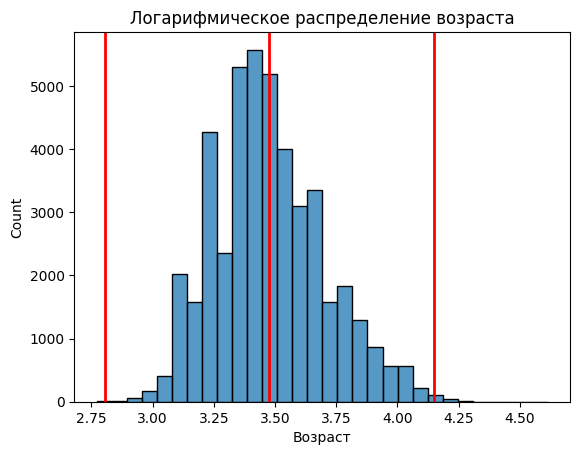

In [124]:
age = np.log(hh_df['Возраст'] + 1)

histplot = sns.histplot(age , bins=30)
histplot.axvline(age.mean(), color='red', lw=2)
histplot.axvline(age.mean() + 3 * age.std(), color='red', lw=2)
histplot.axvline(age.mean() - 3 * age.std(), color='red', lw=2)
histplot.set_title('Логарифмическое распределение возраста');

**Справа больше значений, поэтому логарифмическое распределение имеет правостороннюю асимметрию**


In [132]:
def outliers_z_score_mod(data, feature, log_scale=False, left=3, right=3):
    if log_scale:
        x = np.log(data[feature]+1)
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    return outliers, cleaned

outliers, hh_df = outliers_z_score_mod(hh_df, 'Возраст', log_scale=True, right=4)
display(outliers)

,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст,Опыт работы (месяц),Город,...,частичная занятость,проектная работа,волонтерство,стажировка,полный день,сменный график,гибкий график,удаленная работа,вахтовый метод,ЗП (руб)
31137,Менеджер по работе с клиентами,"ООО ""ФёрстКэшКомпани""",Менеджер по работе с клиентами,2019-04-06,Не указано,среднее,М,15,2.0,Санкт-Петербург,...,True,False,False,False,False,True,True,True,False,10000.0
32950,Тестировщик игр,OOO ЖМЫХ,Тестировщик ПО,2019-04-09,Не указано,среднее специальное,М,15,3.0,другие,...,False,False,False,False,True,False,False,False,False,2000.0
33654,Frontend-разработчик,Freelance,Frontend-разработчик,2019-04-19,Не указано,среднее специальное,М,100,30.0,Санкт-Петербург,...,True,True,False,True,True,False,True,True,False,60000.0


**Возраст соискателей для попадания под категорию выбросов - меньше 16 и больше 99 (но точно об этом по этим данным не сказать)**